In [43]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sc

In [3]:
# load rho-10kb file
data = pd.read_csv("concat_Csec_geq1000_rmind_hardfilt_exhet_biall_dp_qfilt_mac2_maxmiss06_phimp_LDhat_bpen1_statres_filtMQ70depth2stdev.txt_w10kb", sep='\t')
data = data.sort_values(by=['Scaffold', 'Start_bp'])

In [10]:
# load TE
TE = pd.read_csv("rm_out_dir/Csec.fa.modified_col.out", comment='#', sep=' ', header=None, skipinitialspace=True)

In [17]:
TE.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,337,19.2,0.0,0.0,NEVH01000001.1,1,72,(498596),C,rnd-1_family-51,Unknown,(0),76,1,1,NaN
1,226,21.9,8.2,6.1,NEVH01000001.1,2,98,(498570),+,rnd-5_family-5865,Unknown,1433,1531,(245),2,*
2,227,28.3,7.6,4.1,NEVH01000001.1,1097,1214,(497454),C,Copia-16_RC-I,Unspecified,(491),3988,3867,3,*
3,630,27.6,2.4,0.6,NEVH01000001.1,1144,1307,(497361),C,rnd-4_family-856,DNA/hAT-Tip100,(1054),167,1,4,NaN
4,1993,17.8,7.8,0.0,NEVH01000001.1,1344,1742,(496926),C,rnd-1_family-0,LINE/RTE-BovB,(1132),430,1,5,NaN


In [20]:
TE_header = 'SW_score perc_div perc_del perc_ins query_seq query_seq_begin query_seq_end query_seq_left comp/cons matching_repeat repeat_class_family repeat_seq_begin repeat_seq_end repeat_seq_left ID higher_score'.split(' ')

In [21]:
TE.columns = TE_header

In [27]:
TE['class'] = [ i.split('/')[0] for i in TE["repeat_class_family"]]
TE['family'] = [ i.split('/')[-1] for i in TE["repeat_class_family"]]

In [28]:
set(TE["class"])

{'ARTEFACT',
 'DNA',
 'LINE',
 'LTR',
 'Low_complexity',
 'Other',
 'RC',
 'Retroposon',
 'SINE',
 'Satellite',
 'Simple_repeat',
 'Unknown',
 'Unspecified',
 'rRNA',
 'snRNA',
 'tRNA'}

In [46]:
TE['scaffold']=TE['query_seq']

In [47]:
def get_frac_rho_correlations(rho, TE, TE_type="all"):
    if not TE_type=="all":
        TE=TE.loc[TE["class"]==TE_type]
    win_dict = {}
    win_size = 10000
    for i, te in TE.iterrows():
        
        # check bin TE is starting in:
        bin_id = np.floor((te.query_seq_begin/win_size))
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
        win_dict[te.scaffold][bin_id]["counter"] +=1
        win_dict[te.scaffold][bin_id]["id"].append(te.matching_repeat)
        win_dict[te.scaffold][bin_id]["type"].append(te['class'])
        frac = (np.min([bin_top,te.query_seq_end]) - np.max([bin_bottom, te.query_seq_begin]))
        win_dict[te.scaffold][bin_id]["lens"].append(frac)
        win_dict[te.scaffold][bin_id]["frac"] += frac
        while te.query_seq_end>(bin_top*win_size):
            bin_id = bin_id+1
            bin_bottom= bin_id*win_size
            bin_top = (bin_id+1)*win_size
            win_dict.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
            win_dict[te.scaffold][bin_id]["counter"] +=1
            win_dict[te.scaffold][bin_id]["id"].append(te.matching_repeat)
            win_dict[te.scaffold][bin_id]["type"].append(te['class'])
            frac = (np.min([bin_top,te.query_seq_end]) - np.max([bin_bottom, te.query_seq_begin]))
            win_dict[te.scaffold][bin_id]["lens"].append(frac)
            win_dict[te.scaffold][bin_id]["frac"] += frac
            
 
    frac_df_all = []
    for scaffold, item in win_dict.items():
        for bin_name, values in item.items():
            line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
            frac_df_all.append(line)
    frac_df_all = pd.DataFrame(frac_df_all)
    frac_df_all.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep"]
    frac_rho = rho.merge(frac_df_all, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])
    return win_dict, frac_rho

In [48]:
frac_df_dict = {}
for i in list(set(TE["class"])):
    print("processing {i}".format(i=i))
    #print("{num} number of TE's".format(num=TE.shape[0]))
    win_dict, frac_rho = get_frac_rho_correlations(rho=data, TE=TE, TE_type=i)
    frac_df_dict[i] = {"wind":win_dict,"frac":frac_rho }
    print(sc.stats.spearmanr(a=frac_rho["Rho_kb"], b=frac_rho["frac_rep"]))

processing ARTEFACT
SignificanceResult(statistic=-0.9999999999999999, pvalue=nan)
processing RC
SignificanceResult(statistic=-0.006628468878578422, pvalue=0.4575335409503115)
processing DNA
SignificanceResult(statistic=-0.028504910457355388, pvalue=2.444453142790396e-18)
processing tRNA
SignificanceResult(statistic=0.05295354407841732, pvalue=5.9344978718072226e-27)
processing snRNA
SignificanceResult(statistic=0.034289110166813, pvalue=0.7019343845767628)
processing LTR
SignificanceResult(statistic=0.07438850432104832, pvalue=5.24417600827822e-14)
processing Unspecified
SignificanceResult(statistic=-0.0030600956997110544, pvalue=0.4069367386403918)
processing Simple_repeat
SignificanceResult(statistic=0.07157589631253884, pvalue=1.898289610010549e-76)
processing Low_complexity
SignificanceResult(statistic=0.01583072173192773, pvalue=0.1017116123341407)
processing rRNA
SignificanceResult(statistic=0.04910386485630766, pvalue=0.3528887389643586)
processing Satellite
SignificanceResult(s

In [49]:
def get_frac_rho_correlations(rho, TE, TE_type="all"):
    if not TE_type=="all":
        TE=TE.loc[TE["family"]==TE_type]
    win_dict = {}
    win_size = 10000
    for i, te in TE.iterrows():
        
        # check bin TE is starting in:
        bin_id = np.floor((te.query_seq_begin/win_size))
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
        win_dict[te.scaffold][bin_id]["counter"] +=1
        win_dict[te.scaffold][bin_id]["id"].append(te.matching_repeat)
        win_dict[te.scaffold][bin_id]["type"].append(te['class'])
        frac = (np.min([bin_top,te.query_seq_end]) - np.max([bin_bottom, te.query_seq_begin]))
        win_dict[te.scaffold][bin_id]["lens"].append(frac)
        win_dict[te.scaffold][bin_id]["frac"] += frac
        while te.query_seq_end>(bin_top*win_size):
            bin_id = bin_id+1
            bin_bottom= bin_id*win_size
            bin_top = (bin_id+1)*win_size
            win_dict.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
            win_dict[te.scaffold][bin_id]["counter"] +=1
            win_dict[te.scaffold][bin_id]["id"].append(te.matching_repeat)
            win_dict[te.scaffold][bin_id]["type"].append(te['class'])
            frac = (np.min([bin_top,te.query_seq_end]) - np.max([bin_bottom, te.query_seq_begin]))
            win_dict[te.scaffold][bin_id]["lens"].append(frac)
            win_dict[te.scaffold][bin_id]["frac"] += frac
            
 
    frac_df_all = []
    for scaffold, item in win_dict.items():
        for bin_name, values in item.items():
            line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
            frac_df_all.append(line)
    frac_df_all = pd.DataFrame(frac_df_all)
    frac_df_all.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep"]
    frac_rho = rho.merge(frac_df_all, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])
    return win_dict, frac_rho

In [50]:
frac_df_dict = {}
for i in list(set(TE["family"])):
    print("processing {i}".format(i=i))
    #print("{num} number of TE's".format(num=TE.shape[0]))
    win_dict, frac_rho = get_frac_rho_correlations(rho=data, TE=TE, TE_type=i)
    frac_df_dict[i] = {"wind":win_dict,"frac":frac_rho }
    print(sc.stats.spearmanr(a=frac_rho["Rho_kb"], b=frac_rho["frac_rep"]))

processing sno
SignificanceResult(statistic=-0.39285714285714296, pvalue=0.38331687042697266)
processing hAT-Ac
SignificanceResult(statistic=0.037416819365132324, pvalue=6.572993617460241e-17)
processing Gypsy
SignificanceResult(statistic=0.12699239872323095, pvalue=2.2844539804714124e-20)
processing hAT-hATx
SignificanceResult(statistic=nan, pvalue=nan)
processing TcMar-Tc4
SignificanceResult(statistic=nan, pvalue=nan)
processing R2
SignificanceResult(statistic=nan, pvalue=nan)
processing TcMar-m44
SignificanceResult(statistic=0.004067309453212315, pvalue=0.8909853961198193)
processing TcMar-Mariner
SignificanceResult(statistic=-0.04483148073042589, pvalue=8.537317548613534e-14)
processing LINE
SignificanceResult(statistic=-0.00462407933941478, pvalue=0.6350186135113314)
processing IS3EU
SignificanceResult(statistic=-0.02467659418531878, pvalue=0.7998809109141823)
processing Y-chromosome
SignificanceResult(statistic=nan, pvalue=nan)
processing MULE-MuDR
SignificanceResult(statistic=-0

In [51]:

win_dict, frac_rho = get_frac_rho_correlations(rho=data, TE=TE, TE_type="all")
frac_df_dict["all"] = {"wind":win_dict,"frac":frac_rho }
print(sc.stats.spearmanr(a=frac_rho["Rho_kb"], b=frac_rho["frac_rep"]))

SignificanceResult(statistic=0.003239170812679339, pvalue=0.2992340334425543)


In [52]:
TE_Crypton  = TE.loc[TE["family"]=="Crypton-V"]

In [53]:
TE_Crypton

,SW_score,perc_div,perc_del,perc_ins,query_seq,query_seq_begin,query_seq_end,query_seq_left,comp/cons,matching_repeat,repeat_class_family,repeat_seq_begin,repeat_seq_end,repeat_seq_left,ID,higher_score,class,family,scaffold
227081,255,19.6,1.8,0.0,NEVH01002140.1,1449170,1449225,(432188),+,CryptonV-1_DR,DNA/Crypton-V,2669,2725,(15148),216024,*,DNA,Crypton-V,NEVH01002140.1
258305,245,18.4,0.0,4.2,NEVH01002150.1,802658,802731,(144507),+,CryptonV-1_DR,DNA/Crypton-V,12597,12667,(5206),245691,*,DNA,Crypton-V,NEVH01002150.1
3177943,225,20.0,4.6,0.0,NEVH01025648.1,123079,123143,(460419),C,CryptonV-1_DR,DNA/Crypton-V,(10953),6920,6853,3021072,*,DNA,Crypton-V,NEVH01025648.1
3301447,228,21.5,0.0,8.7,NEVH01026391.1,2207967,2208078,(145241),+,CryptonV-1_DR,DNA/Crypton-V,6827,6929,(10944),3138522,*,DNA,Crypton-V,NEVH01026391.1


In [226]:
TE_simple = TE.loc[TE["type"]=="Simple_repeat"]

In [7]:
TE["scaffold"]=[ i.split(",")[0] for i in TE[0]]

In [57]:
TE.columns = ["scaff_inf", "start", "end", "type", "id", "length_bp", 'scaffold']

In [142]:
TE_line = TE.loc[TE["type"].isin(['SINE', "LINE"])]

In [241]:
TE_LTR = TE.loc[TE["type"]=="LTR"]

In [249]:
TE_rRNA

,scaff_inf,start,end,type,id,length_bp,scaffold
3569,"scaffold1,52763537,f1Z52763537",1461027,1461123,rRNA,NaN,96,scaffold1
11062,"scaffold1,52763537,f1Z52763537",3903248,3903399,rRNA,NaN,151,scaffold1
12540,"scaffold1,52763537,f1Z52763537",4344208,4344932,rRNA,NaN,724,scaffold1
12543,"scaffold1,52763537,f1Z52763537",4345219,4345343,rRNA,NaN,124,scaffold1
12916,"scaffold1,52763537,f1Z52763537",4449313,4449473,rRNA,NaN,160,scaffold1
...,...,...,...,...,...,...,...
3314226,"scaffold99,1813851,f98Z1813851",250518,250781,rRNA,NaN,263,scaffold99
3316280,"scaffold99,1813851,f98Z1813851",1263406,1263558,rRNA,NaN,152,scaffold99
3316282,"scaffold99,1813851,f98Z1813851",1263560,1264010,rRNA,NaN,450,scaffold99
3316289,"scaffold99,1813851,f98Z1813851",1264944,1265049,rRNA,NaN,105,scaffold99


In [26]:
win_size = 10_000

bin_id = int(np.floor((1813291/win_size)))

In [27]:
bin_bottom= bin_id*win_size

In [28]:
bin_bottom

1810000

In [34]:
c = Counter()

In [38]:
c=0

In [46]:
c +=1

In [47]:
c

3

In [271]:
win_dict = {}
win_size = 10000
for i, te in TE.iterrows():
    
    # check bin TE is starting in:
    bin_id = np.floor((te.start/win_size))
    bin_bottom= bin_id*win_size
    bin_top = (bin_id+1)*win_size
    win_dict.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
    win_dict[te.scaffold][bin_id]["counter"] +=1
    win_dict[te.scaffold][bin_id]["id"].append(te.id)
    win_dict[te.scaffold][bin_id]["type"].append(te.type)
    frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
    win_dict[te.scaffold][bin_id]["lens"].append(frac)
    win_dict[te.scaffold][bin_id]["frac"] += frac
    while te.end>(bin_top*win_size):
        bin_id = bin_id+1
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
        win_dict[te.scaffold][bin_id]["counter"] +=1
        win_dict[te.scaffold][bin_id]["id"].append(te.id)
        win_dict[te.scaffold][bin_id]["type"].append(te.type)
        frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
        win_dict[te.scaffold][bin_id]["lens"].append(frac)
        win_dict[te.scaffold][bin_id]["frac"] += frac
        
 
frac_df_all = []
for scaffold, item in win_dict.items():
    for bin_name, values in item.items():
        line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
        frac_df_all.append(line)
frac_df_all = pd.DataFrame(frac_df_all)
frac_df_all.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep"]

In [143]:
win_dict_LINE = {}
win_size = 10000
for i, te in TE_line.iterrows():
    
    # check bin TE is starting in:
    bin_id = np.floor((te.start/win_size))
    bin_bottom= bin_id*win_size
    bin_top = (bin_id+1)*win_size
    win_dict_LINE.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
    win_dict_LINE[te.scaffold][bin_id]["counter"] +=1
    win_dict_LINE[te.scaffold][bin_id]["id"].append(te.id)
    win_dict_LINE[te.scaffold][bin_id]["type"].append(te.type)
    frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
    win_dict_LINE[te.scaffold][bin_id]["lens"].append(frac)
    win_dict_LINE[te.scaffold][bin_id]["frac"] += frac
    while te.end>(bin_top*win_size):
        bin_id = bin_id+1
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict_LINE.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
        win_dict_LINE[te.scaffold][bin_id]["counter"] +=1
        win_dict_LINE[te.scaffold][bin_id]["id"].append(te.id)
        win_dict_LINE[te.scaffold][bin_id]["type"].append(te.type)
        frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
        win_dict_LINE[te.scaffold][bin_id]["lens"].append(frac)
        win_dict_LINE[te.scaffold][bin_id]["frac"] += frac
        
 
frac_df = []
for scaffold, item in win_dict_LINE.items():
    for bin_name, values in item.items():
        line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
        frac_df.append(line)
frac_df = pd.DataFrame(frac_df)
frac_df.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep", ]

In [234]:
win_dict_simple = {}
win_size = 10000
for i, te in TE_simple.iterrows():
    
    # check bin TE is starting in:
    bin_id = np.floor((te.start/win_size))
    bin_bottom= bin_id*win_size
    bin_top = (bin_id+1)*win_size
    win_dict_simple.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
    win_dict_simple[te.scaffold][bin_id]["counter"] +=1
    win_dict_simple[te.scaffold][bin_id]["id"].append(te.id)
    win_dict_simple[te.scaffold][bin_id]["type"].append(te.type)
    frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
    win_dict_simple[te.scaffold][bin_id]["lens"].append(frac)
    win_dict_simple[te.scaffold][bin_id]["frac"] += frac
    while te.end>(bin_top*win_size):
        bin_id = bin_id+1
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict_simple.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
        win_dict_simple[te.scaffold][bin_id]["counter"] +=1
        win_dict_simple[te.scaffold][bin_id]["id"].append(te.id)
        win_dict_simple[te.scaffold][bin_id]["type"].append(te.type)
        frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
        win_dict_simple[te.scaffold][bin_id]["lens"].append(frac)
        win_dict_simple[te.scaffold][bin_id]["frac"] += frac
        
 
frac_df_simple = []
for scaffold, item in win_dict_simple.items():
    for bin_name, values in item.items():
        line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
        frac_df_simple.append(line)
frac_df_simple = pd.DataFrame(frac_df_simple)
frac_df_simple.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep", ]

In [243]:
win_dict_LTR = {}
win_size = 10000
for i, te in TE_LTR.iterrows():
    
    # check bin TE is starting in:
    bin_id = np.floor((te.start/win_size))
    bin_bottom= bin_id*win_size
    bin_top = (bin_id+1)*win_size
    win_dict_LTR.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
    win_dict_LTR[te.scaffold][bin_id]["counter"] +=1
    win_dict_LTR[te.scaffold][bin_id]["id"].append(te.id)
    win_dict_LTR[te.scaffold][bin_id]["type"].append(te.type)
    frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
    win_dict_LTR[te.scaffold][bin_id]["lens"].append(frac)
    win_dict_LTR[te.scaffold][bin_id]["frac"] += frac
    while te.end>(bin_top*win_size):
        bin_id = bin_id+1
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict_LTR.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
        win_dict_LTR[te.scaffold][bin_id]["counter"] +=1
        win_dict_LTR[te.scaffold][bin_id]["id"].append(te.id)
        win_dict_LTR[te.scaffold][bin_id]["type"].append(te.type)
        frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
        win_dict_LTR[te.scaffold][bin_id]["lens"].append(frac)
        win_dict_LTR[te.scaffold][bin_id]["frac"] += frac
        
 
frac_df_LTR = []
for scaffold, item in win_dict_LTR.items():
    for bin_name, values in item.items():
        line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
        frac_df_LTR.append(line)
frac_df_LTR = pd.DataFrame(frac_df_LTR)
frac_df_LTR.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep", ]

In [ ]:
win_dict_LINE = {}
win_size = 10000
for i, te in TE_line.iterrows():
    
    # check bin TE is starting in:
    bin_id = np.floor((te.start/win_size))
    bin_bottom= bin_id*win_size
    bin_top = (bin_id+1)*win_size
    win_dict_LINE.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
    win_dict_LINE[te.scaffold][bin_id]["counter"] +=1
    win_dict_LINE[te.scaffold][bin_id]["id"].append(te.id)
    win_dict_LINE[te.scaffold][bin_id]["type"].append(te.type)
    frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
    win_dict_LINE[te.scaffold][bin_id]["lens"].append(frac)
    win_dict_LINE[te.scaffold][bin_id]["frac"] += frac
    while te.end>(bin_top*win_size):
        bin_id = bin_id+1
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict_LINE.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
        win_dict_LINE[te.scaffold][bin_id]["counter"] +=1
        win_dict_LINE[te.scaffold][bin_id]["id"].append(te.id)
        win_dict_LINE[te.scaffold][bin_id]["type"].append(te.type)
        frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
        win_dict_LINE[te.scaffold][bin_id]["lens"].append(frac)
        win_dict_LINE[te.scaffold][bin_id]["frac"] += frac
        
 
frac_df = []
for scaffold, item in win_dict_LINE.items():
    for bin_name, values in item.items():
        line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
        frac_df.append(line)
frac_df = pd.DataFrame(frac_df)
frac_df.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep", ]

In [248]:
win_dict_rrna = {}
win_size = 10000
for i, te in TE_rRNA.iterrows():
    
    # check bin TE is starting in:
    bin_id = np.floor((te.start/win_size))
    bin_bottom= bin_id*win_size
    bin_top = (bin_id+1)*win_size
    win_dict_rrna.setdefault(te.scaffold, {}).setdefault(bin_id, {"counter":0,'id':[], "type":[],"frac":0, "lens":[] })
    win_dict_rrna[te.scaffold][bin_id]["counter"] +=1
    win_dict_rrna[te.scaffold][bin_id]["id"].append(te.id)
    win_dict_rrna[te.scaffold][bin_id]["type"].append(te.type)
    frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
    win_dict_rrna[te.scaffold][bin_id]["lens"].append(frac)
    win_dict_rrna[te.scaffold][bin_id]["frac"] += frac
    while te.end>(bin_top*win_size):
        bin_id = bin_id+1
        bin_bottom= bin_id*win_size
        bin_top = (bin_id+1)*win_size
        win_dict_rrna.setdefault(bin_id, {"counter":0,'id':[], "type":[],frac:0 })
        win_dict_rrna[te.scaffold][bin_id]["counter"] +=1
        win_dict_rrna[te.scaffold][bin_id]["id"].append(te.id)
        win_dict_rrna[te.scaffold][bin_id]["type"].append(te.type)
        frac = (np.min([bin_top,te.end]) - np.max([bin_bottom, te.start]))
        win_dict_rrna[te.scaffold][bin_id]["lens"].append(frac)
        win_dict_rrna[te.scaffold][bin_id]["frac"] += frac
        
 
frac_df_rrna = []
for scaffold, item in win_dict_rrna.items():
    for bin_name, values in item.items():
        line = [scaffold, bin_name*win_size, (bin_name+1)*win_size, values['frac']]
        frac_df_rrna.append(line)
frac_df_rrna = pd.DataFrame(frac_df_rrna)
frac_df_rrna.columns = ["scaffold", 'start_bin', "stop_win", "frac_rep", ]

In [164]:
frac_rho_LINE = data.merge(frac_df, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])

In [236]:
frac_rho_simple = data.merge(frac_df_simple, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])

In [244]:
frac_rho_LTR = data.merge(frac_df_LTR, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])

In [250]:
frac_rho_rrna = data.merge(frac_df_rrna, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])

In [273]:
frac_rho_all = data.merge(frac_df_all, left_on=["Scaffold", "Start_bp"], right_on=["scaffold", "start_bin"])


/tmp/ipykernel_1192603/1803543324.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(frac_rho_LINE.loc[frac_rho_LINE.frac_rep<1000].Rho_kb)
/tmp/ipykernel_1192603/1803543324.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(frac_rho_LINE.loc[frac_rho_LINE.frac_rep>3000].Rho_kb)


<Axes: xlabel='Rho_kb', ylabel='Density'>

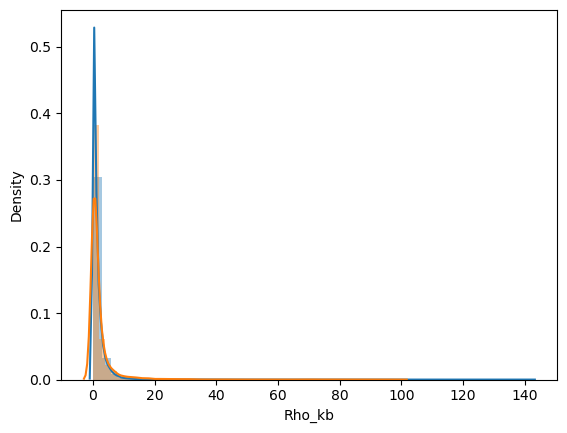

In [198]:
sns.distplot(frac_rho_LINE.loc[frac_rho_LINE.frac_rep<1000].Rho_kb)
sns.distplot(frac_rho_LINE.loc[frac_rho_LINE.frac_rep>3000].Rho_kb)

<Axes: xlabel='frac_rep', ylabel='Rho_kb'>

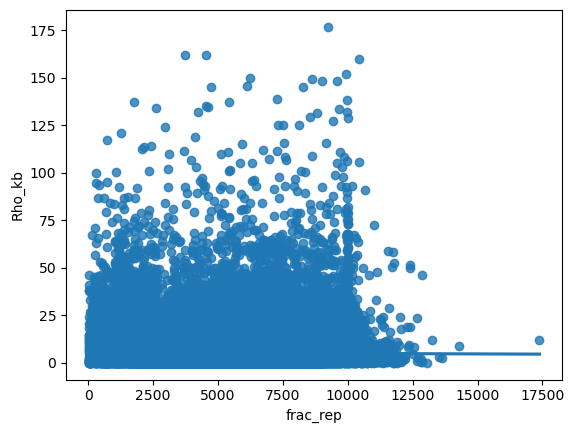

In [55]:
sns.regplot(y=frac_df_dict['all']["frac"].Rho_kb, x=frac_df_dict['all']["frac"].frac_rep)

<Axes: xlabel='frac_rep', ylabel='Rho_kb'>

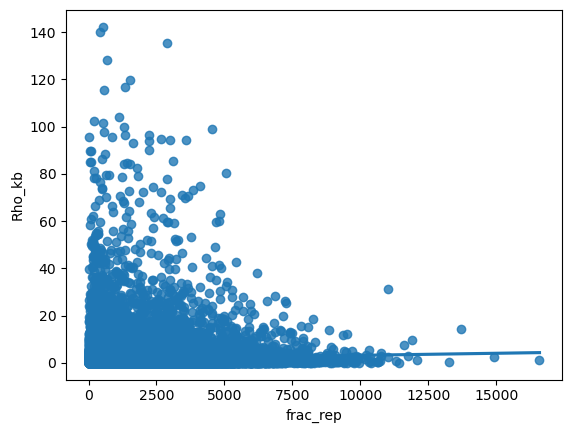

In [240]:
sns.regplot(y=frac_rho_LINE.Rho_kb, x=frac_rho_LINE.frac_rep)

<Axes: xlabel='frac_rep', ylabel='Rho_kb'>

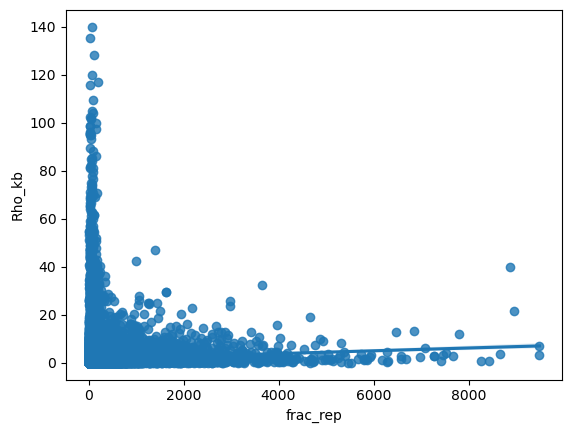

In [237]:
sns.regplot(y=frac_rho_simple.Rho_kb, x=frac_rho_simple.frac_rep)

<Axes: xlabel='frac_rep', ylabel='Rho_kb'>

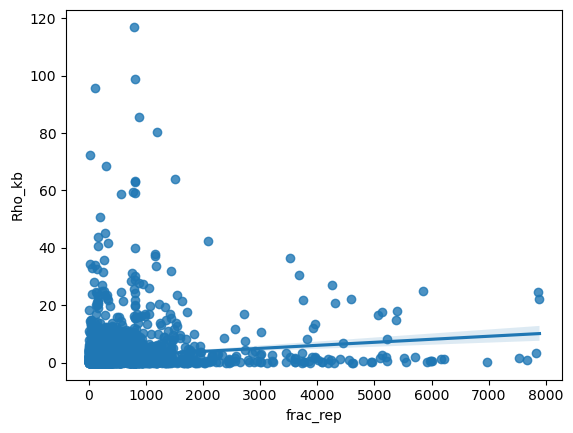

In [245]:
sns.regplot(y=frac_rho_LTR.Rho_kb, x=frac_rho_LTR.frac_rep)

<Axes: xlabel='frac_rep', ylabel='Rho_kb'>

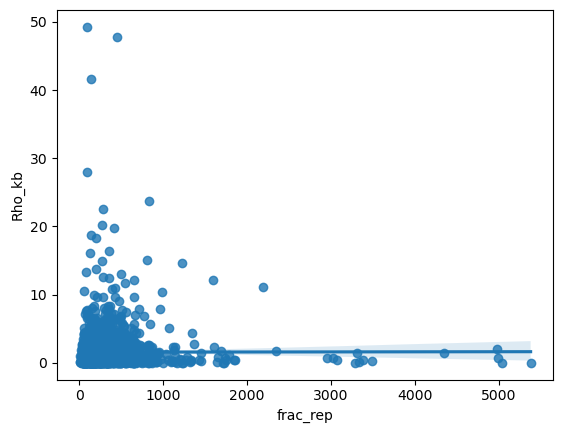

In [252]:
sns.regplot(y=frac_rho_rrna.Rho_kb, x=frac_rho_rrna.frac_rep)

<Axes: xlabel='frac_rep', ylabel='Rho_kb'>

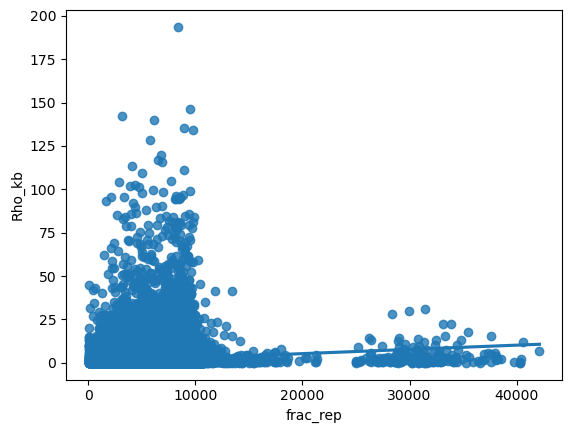

In [274]:
sns.regplot(y=frac_rho_all.Rho_kb, x=frac_rho_all.frac_rep)

(array([3.3247e+04, 7.5238e+04, 3.7790e+03, 8.1000e+01, 1.8000e+01,
        9.0000e+00, 5.4000e+01, 8.2000e+01, 2.7000e+01, 1.2000e+01]),
 array([2.20000e+01, 4.23390e+03, 8.44580e+03, 1.26577e+04, 1.68696e+04,
        2.10815e+04, 2.52934e+04, 2.95053e+04, 3.37172e+04, 3.79291e+04,
        4.21410e+04]),
 <BarContainer object of 10 artists>)

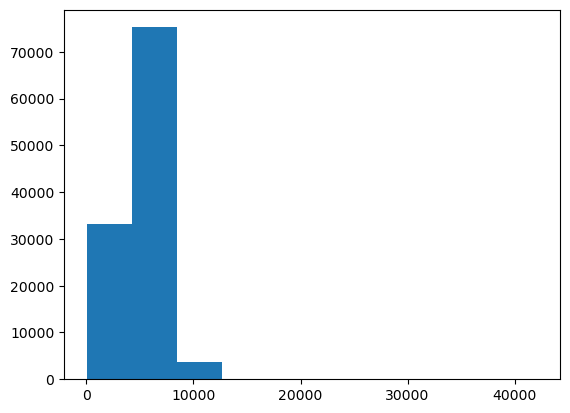

In [278]:
plt.hist(frac_rho_all.frac_rep)

In [169]:
import statsmodels.api as sm

In [254]:
import scipy as sc

In [288]:
print(sc.stats.spearmanr(a=frac_rho_rrna["Rho_kb"], b=frac_rho_rrna["frac_rep"]))

SignificanceResult(statistic=0.036266955344111826, pvalue=0.09196649771383378)


In [258]:
sc.stats.spearmanr(a=frac_rho_LTR["Rho_kb"], b=frac_rho_LTR["frac_rep"])

SignificanceResult(statistic=0.12318843419913456, pvalue=6.323754646802853e-18)

In [259]:
sc.stats.spearmanr(a=frac_rho_LINE["Rho_kb"], b=frac_rho_LINE["frac_rep"])

SignificanceResult(statistic=-0.007022541303985112, pvalue=0.02503572010770027)

In [260]:
sc.stats.spearmanr(a=frac_rho_simple["Rho_kb"], b=frac_rho_simple["frac_rep"])

SignificanceResult(statistic=0.05678879194461521, pvalue=5.987136737997808e-69)

In [275]:
sc.stats.spearmanr(a=frac_rho_all["Rho_kb"], b=frac_rho_all["frac_rep"])

SignificanceResult(statistic=0.2562654144358001, pvalue=0.0)

In [279]:
rr = sm.formula.ols("Rho_kb ~ frac_rep", data=frac_rho_all)
rfit = rr.fit()
rfit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Rho_kb   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     1638.
Date:                Thu, 01 Feb 2024   Prob (F-statistic):               0.00
Time:                        11:33:18   Log-Likelihood:            -3.2016e+05
No. Observations:              112547   AIC:                         6.403e+05
Df Residuals:                  112545   BIC:                         6.403e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.3945      0.034     11.586      0.000       0.328       0.461
frac_rep       0.0002   6.03e-06     40.468      0.000       0.000       0.000
==============================================================================
Omnibus:                   202081.099   Durbin-Watson:                   0.868
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        356665472.196
Skew:                          13.050   Prob(JB):                         0.00
Kurtosis:                     277.546   Cond. No.                     1.55e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.55e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [253]:
rr = sm.formula.ols("Rho_kb ~ frac_rep", data=frac_rho_rrna)
rfit = rr.fit()
rfit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Rho_kb   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                  0.006616
Date:                Thu, 01 Feb 2024   Prob (F-statistic):              0.935
Time:                        10:39:44   Log-Likelihood:                -5257.3
No. Observations:                2160   AIC:                         1.052e+04
Df Residuals:                    2158   BIC:                         1.053e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.5576      0.080     19.573      0.000       1.402       1.714
frac_rep    1.284e-05      0.000      0.081      0.935      -0.000       0.000
==============================================================================
Omnibus:                     3084.137   Durbin-Watson:                   1.863
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1098174.013
Skew:                           8.225   Prob(JB):                         0.00
Kurtosis:                     112.231   Cond. No.                         675.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [246]:
rr = sm.formula.ols("Rho_kb ~ frac_rep", data=frac_rho_LTR)
rfit = rr.fit()
rfit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Rho_kb   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     81.13
Date:                Wed, 31 Jan 2024   Prob (F-statistic):           2.97e-19
Time:                        16:10:05   Log-Likelihood:                -15211.
No. Observations:                4869   AIC:                         3.043e+04
Df Residuals:                    4867   BIC:                         3.044e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.8634      0.093     20.011      0.000       1.681       2.046
frac_rep       0.0011      0.000      9.007      0.000       0.001       0.001
==============================================================================
Omnibus:                     7312.130   Durbin-Watson:                   1.338
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          3265527.650
Skew:                           9.232   Prob(JB):                         0.00
Kurtosis:                     128.520   Cond. No.                         940.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [238]:
rr = sm.formula.ols("Rho_kb ~ frac_rep", data=frac_rho_LINE)
rfit = rr.fit()
rfit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Rho_kb   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     245.0
Date:                Wed, 31 Jan 2024   Prob (F-statistic):           3.76e-55
Time:                        15:43:35   Log-Likelihood:            -2.7767e+05
No. Observations:              101821   AIC:                         5.553e+05
Df Residuals:                  101819   BIC:                         5.554e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.4260      0.016     88.165      0.000       1.394       1.458
frac_rep       0.0002   1.11e-05     15.652      0.000       0.000       0.000
==============================================================================
Omnibus:                   182916.807   Durbin-Watson:                   0.893
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        335184990.700
Skew:                          13.045   Prob(JB):                         0.00
Kurtosis:                     282.866   Cond. No.                     2.04e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.04e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [239]:
rr = sm.formula.ols("Rho_kb ~ frac_rep", data=frac_rho_simple)
rfit = rr.fit()
rfit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 Rho_kb   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     207.9
Date:                Wed, 31 Jan 2024   Prob (F-statistic):           4.53e-47
Time:                        15:43:44   Log-Likelihood:            -2.5792e+05
No. Observations:               95350   AIC:                         5.158e+05
Df Residuals:                   95348   BIC:                         5.159e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.4921      0.013    114.070      0.000       1.466       1.518
frac_rep       0.0006   4.05e-05     14.417      0.000       0.001       0.001
==============================================================================
Omnibus:                   172477.800   Durbin-Watson:                   0.974
Prob(Omnibus):                  0.000   Jarque-Bera (JB):        334203377.835
Skew:                          13.223   Prob(JB):                         0.00
Kurtosis:                     291.827   Cond. No.                         361.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

<Axes: xlabel='start_bin', ylabel='frac_rep'>

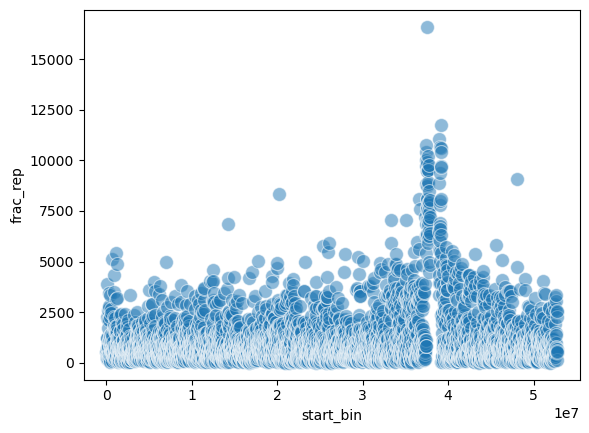

In [162]:
sns.scatterplot(data=frac_df.loc[frac_df.scaffold=="scaffold1"], x='start_bin', y="frac_rep",s=100, alpha=0.5)

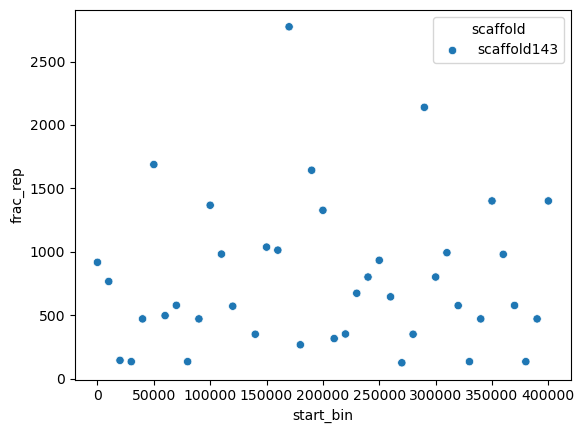

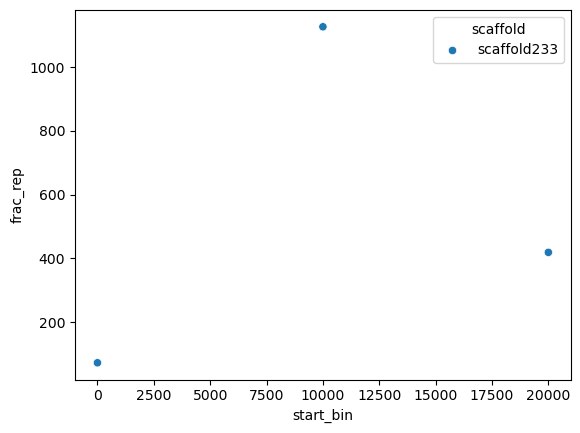

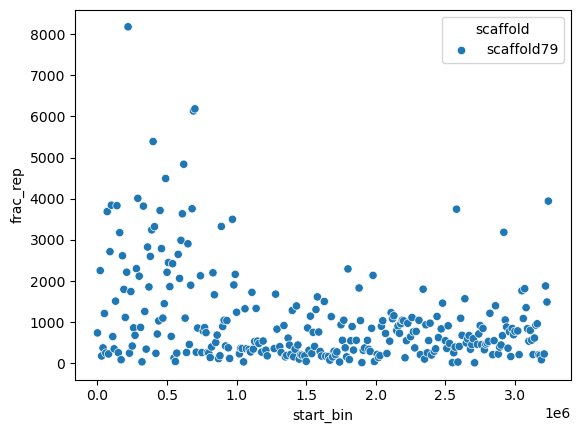

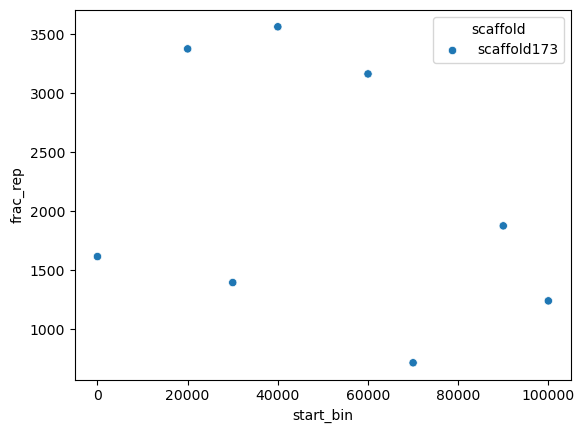

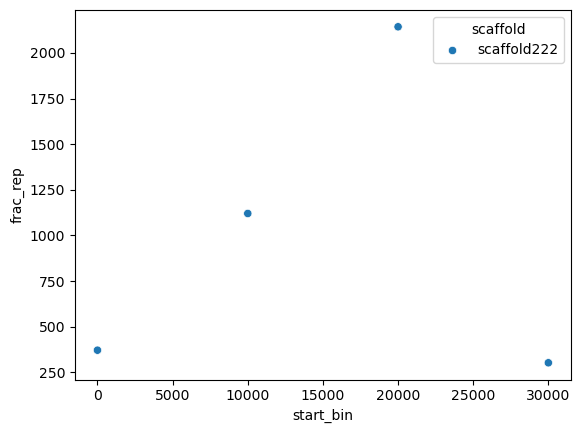

...

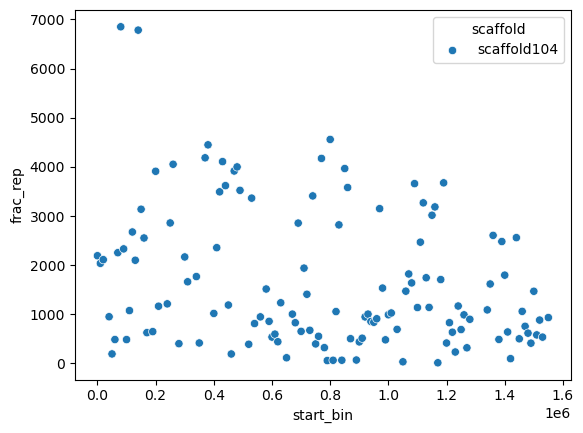

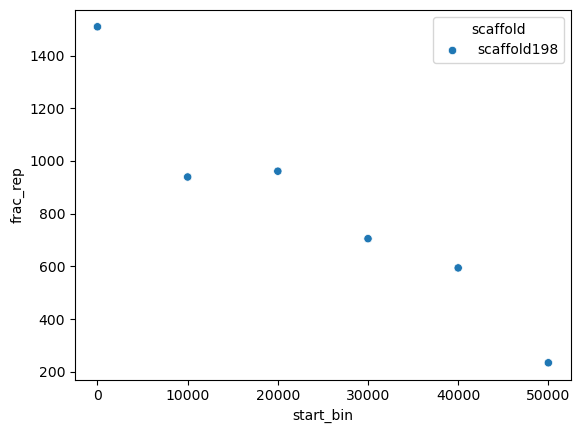

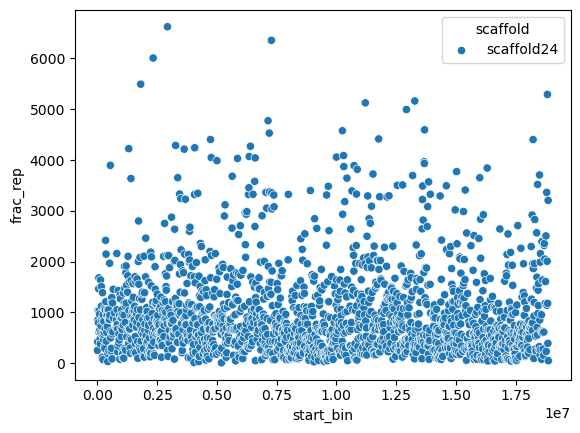

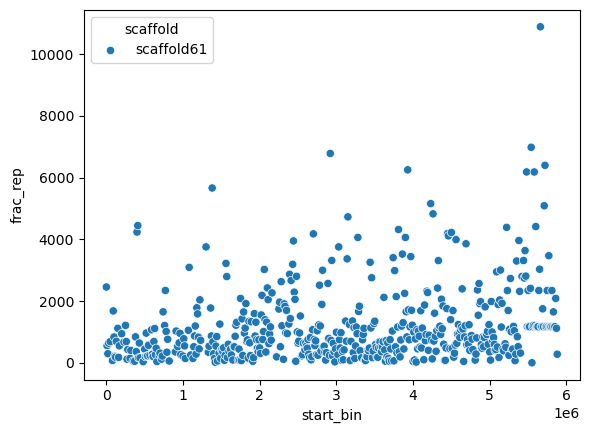

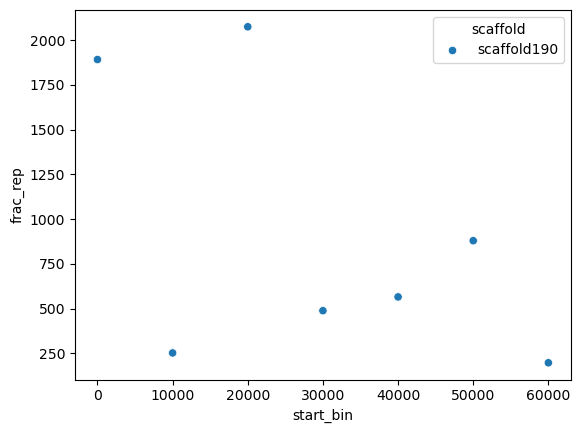

In [145]:
for scaffold in list(set(frac_df.scaffold)):
    sns.scatterplot(data=frac_df.loc[frac_df.scaffold==scaffold], x='start_bin', y="frac_rep", hue='scaffold')
    plt.show()